In [1]:
include("functions.jl")
using Plots, JLD2, LaTeXStrings, FileIO

### Over Single Trajectory

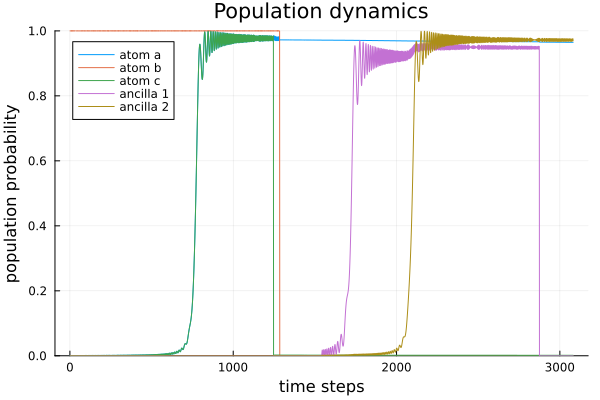

In [86]:
#Try trajectory 7 and 37
@load "Z:/master_work/5_atom_work/N_atoms=5_γ_decay=0.001_Ntraj=47.jld2"
population_data = population_data;

plot(population_data[:a],  ylim=[0,1], label="atom a", xlabel="time steps", ylabel="population probability", title="Population dynamics")
plot!(population_data[:b], label="atom b")
plot!(population_data[:c], label="atom c")
plot!(population_data[:a1],label="ancilla 1")
plot!(population_data[:a2], label="ancilla 2")

### Average over 100 trajectories

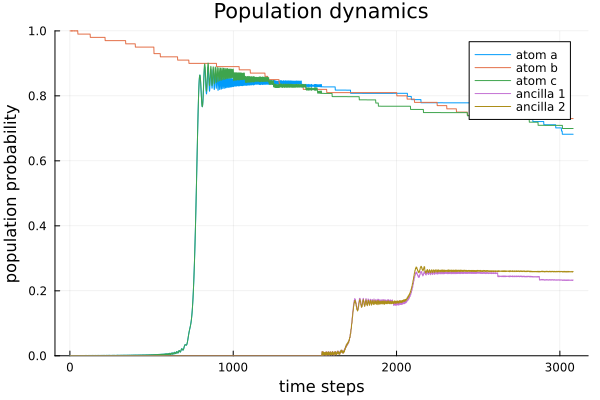

In [2]:
@load "Z:/master_work/5_atom_work/N_atoms=5_γ_decay=0.001_Ntraj=100_avg.jld2"
population_data = avg_population_data;

plot(population_data[:a],  ylim=[0,1], label="atom a", xlabel="time steps", ylabel="population probability", title="Population dynamics")
plot!(population_data[:b], label="atom b")
plot!(population_data[:c], label="atom c")
plot!(population_data[:a1],label="ancilla 1")
plot!(population_data[:a2], label="ancilla 2")

## Analyzing Error Corrected Data

In [2]:
@load "Z:/master_work/5_atom_correction/N_atoms=5_γ_decay=0.001_Ntraj=100_avg.jld2"
population_data = avg_population_data;
corrected_population_data = avg_corrected_population_data;
fidelity_data = avg_fidelity_data;
# end_time = end_time;

50001-element Vector{Float64}:
 0.5106163529926024
 0.5106605587931762
 0.5106008060306261
 0.5106680963668561
 0.5106193738387392
 0.510659423417871
 0.5106026503067528
 0.5106607863681105
 0.5106234984172809
 0.5106562948882845
 ⋮
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0

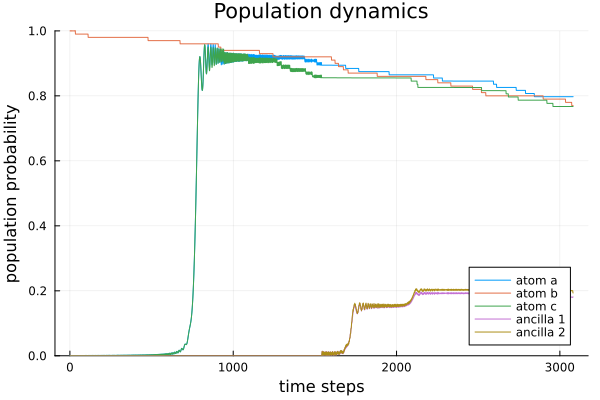

In [3]:
plot(population_data[:a],  ylim=[0,1], label="atom a", xlabel="time steps", ylabel="population probability", title="Population dynamics")
plot!(population_data[:b], label="atom b")
plot!(population_data[:c], label="atom c")
plot!(population_data[:a1],label="ancilla 1")
plot!(population_data[:a2], label="ancilla 2")

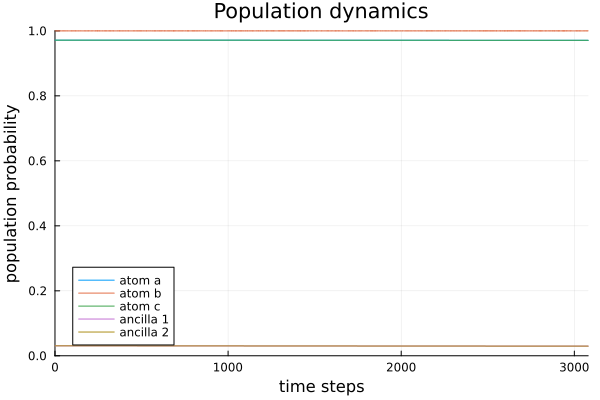

In [4]:
plot(corrected_population_data[:a], xlim=[0,10*tspan[end]],  ylim=[0,1], label="atom a", xlabel="time steps", ylabel="population probability", title="Population dynamics")
plot!(corrected_population_data[:b], label="atom b")
plot!(corrected_population_data[:c], label="atom c")
plot!(corrected_population_data[:a1],label="ancilla 1")
plot!(corrected_population_data[:a2], label="ancilla 2")

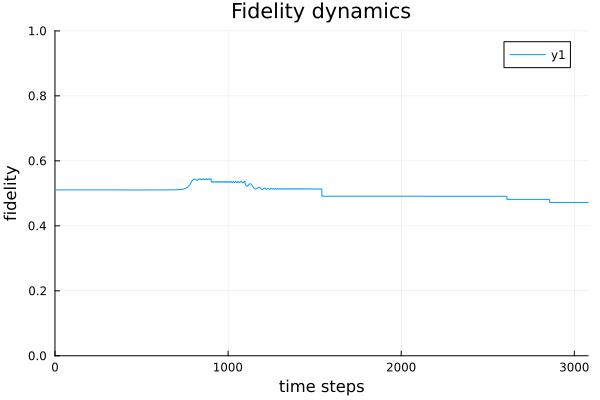

In [5]:
plot(fidelity_data, xlim=[0,10*tspan[end]], ylim=[0,1], xlabel="time steps", ylabel="fidelity", title="Fidelity dynamics")

In [9]:
ψ0 = initialize_system()

full_basis = CompositeBasis([NLevelBasis(2) for _ in 1:total_qubits]...)
ψ0_ket = Ket(full_basis, ComplexF32.(ψ0)) 

tout, ψt = timeevolution.mcwf_dynamic(tspan,ψ0_ket,f,maxiters=1e9,seed=(1));

In [12]:
length(tout)

3081

In [15]:
ψt[end]

Ket(dim=32)
  basis: [NLevel(N=2) ⊗ NLevel(N=2) ⊗ NLevel(N=2) ⊗ NLevel(N=2) ⊗ NLevel(N=2)]
           0.0f0 + 0.0f0im
           0.0f0 + 0.0f0im
           0.0f0 + 0.0f0im
           0.0f0 + 0.0f0im
           0.0f0 + 0.0f0im
           0.0f0 + 0.0f0im
           0.0f0 + 0.0f0im
           0.0f0 + 0.0f0im
 -0.0013344472f0 - 0.00059890683f0im
 -0.0017764324f0 - 0.0060360003f0im
                 ⋮
           0.0f0 + 0.0f0im
   0.033489734f0 + 0.01717941f0im
   0.037564732f0 + 0.1574726f0im
  0.0010753017f0 + 0.0020464915f0im
 -0.0036863433f0 + 0.009142437f0im
   -0.83633715f0 - 0.4870318f0im
   -0.02480241f0 - 0.0540004f0im
   -0.02480241f0 - 0.0540004f0im
 0.00069813314f0 - 0.003487948f0im